# Deep Dive: Simulating Morphologically Accurate Neurons with CRANTpy
This tutorial will guide you through the process of simulating morphologically accurate neurons using the CRANTpy library. We will cover the installation of necessary packages, loading neuron morphology data, setting up the simulation environment, and running a basic simulation.

In [1]:
# Import CRANTpy and other necessary libraries
import crantpy as cp
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import navis

# Set up logging to see progress
cp.set_logging_level("INFO")

print("CRANTpy loaded successfully!")
print(f"Default dataset: {cp.CRANT_DEFAULT_DATASET}")

CRANTpy loaded successfully!
Default dataset: latest


## 1. Authentication Setup

Before we can access the data, we need to authenticate with the CAVE service. This is typically a one-time setup.

In [2]:
# Generate and save authentication token (uncomment if first time)
# cp.generate_cave_token(save=True)

# Test connection
try:
    client = cp.get_cave_client()
    print(f"Successfully connected to datastack: {client.datastack_name}")
    print(f"Server: {client.server_address}")
except Exception as e:
    print(f"Connection failed: {e}")
    print("Please run: cp.generate_cave_token(save=True)")

Successfully connected to datastack: kronauer_ant
Server: https://proofreading.zetta.ai


## NEURON Installation
To simulate neurons, we need to install the python interface for NEURON, a popular simulation environment for modeling individual neurons and networks of neurons.

In [18]:
!pip install neuron -q

import neuron
import navis.interfaces.neuron as nrn

In [32]:
# load a sample PN from crantpy
opn_criteria = cp.NeuronCriteria(cell_class='olfactory_projection_neuron', side='right', tract='mALT')
opn = opn_criteria.get_roots()[0]

# get the skeleton
n = cp.get_l2_skeleton(opn)
n = cp.reroot_at_soma(n)
n.soma = n.root
n = cp.attach_synapses(n, clean=True, max_distance=1000)


2025-10-07 18:08:24 - INFO - Fetching L2 skeleton for root ID: 576460752773799604


Skeletonizing:   0%|          | 0/354159 [00:00<?, ?it/s]

2025-10-07 18:08:36 - INFO - Attached 6592 connectors to neuron 576460752773799604


In [34]:
n = navis.split_axon_dendrite(n, label_only=True, cellbodyfiber="soma")

# change unit to microns from nm
n = n * 1e-3
# Create the compartment model
cmp = nrn.CompartmentModel(n, res=10)

# Set the specific axial resistivity for the entire neuron in Ohm cm
cmp.Ra = 266.1

# Set the specific membran capacitance in mF / cm**2
cmp.cm = 0.8

# Add passive membran properties for the entire neuron
cmp.insert(
    "pas",
    g=1
    / 20800,  # specific leakage conductance = 1/Rm; Rm = specific membran resistance in Ohm cm**2
    e=-60,  # leakage reverse potential
)

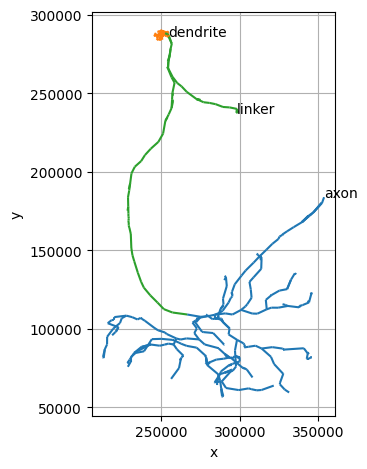

In [35]:
import matplotlib.pyplot as plt

fig, ax = navis.plot2d(
    skel, color_by="compartment", palette="tab10", lw=1.5
)

# Label compartments
for l in skel.nodes.compartment.unique():
    loc = skel.nodes.loc[skel.nodes.compartment == l, ["x", "y", "z"]].values[-1]
    ax.text(loc[0] + 10, loc[1], l)

plt.tight_layout()

In [36]:
# Collect axon nodes
axon_nodes = n.nodes.loc[n.nodes.compartment.isin(["axon", "linker"]), "node_id"].values

# Get the sections for the given nodes
axon_secs = list(set(cmp.get_node_section(axon_nodes)))

# Insert HH mechanism at the given sections
cmp.insert("hh", subset=axon_secs)

In [37]:
dists = navis.geodesic_matrix(n, from_=n.soma)

# Sort by distance from soma
dists = dists.iloc[0].sort_values()

dists.head(10)

400     0.000000
398     2.574118
397     2.775527
399     3.277038
358     5.067570
357    14.071592
291    20.047707
290    27.316755
254    32.438854
256    37.647346
Name: 400, dtype: float32

In [38]:
# Find the closest "dendrite" and the most distal "axon" node
dend = n.nodes[n.nodes.compartment == "dendrite"].node_id.values
dend_base = dists.index[dists.index.isin(dend)][0]
print(f"Node at the base of the dendrites: {dend_base}")

axo = n.nodes[n.nodes.compartment == "axon"].node_id.values
axo_tip = dists.index[dists.index.isin(axo)][-1]
print(f"Node at the tip of the axon: {axo_tip}")

Node at the base of the dendrites: 131
Node at the tip of the axon: 17


In [39]:
# Add voltage recordings
cmp.add_voltage_record(dend_base, label="dendrite_base")
cmp.add_voltage_record(axo_tip, label="axon_tip")
cmp.add_voltage_record(n.soma, label="soma")

In [40]:
# Get dendritic postsynapses
post = n.postsynapses[n.postsynapses.compartment == "dendrite"]
post.head()

,connector_id,x,y,z,partner_id,type,node_id,compartment
6459,6459,253.904,287.936,104.076,576460752650983024,post,135,dendrite
6460,6460,253.152,289.888,105.210,576460752769017234,post,136,dendrite
6461,6461,251.328,284.928,106.806,576460752705584683,post,119,dendrite
6462,6462,250.960,285.920,102.774,576460752688729301,post,99,dendrite
6463,6463,252.640,286.624,101.724,576460752688729301,post,132,dendrite


In [41]:
# Here we will open successively more synapses over 5 stimulations
for i in range(5):
    # Onset for this stimulation
    start = 50 + i * 200
    # Number of synapses to activate
    n_syn = i * 5
    cmp.add_synaptic_current(
        where=post.node_id.unique()[0:n_syn], start=start, max_syn_cond=0.1, rev_pot=-10
    )

In [42]:
# Now we can run our simulation for 1000ms
# (this is equivalent to neuron.h.finitialize + neuron.h.continuerun)
cmp.run_simulation(1000, v_init=-60)

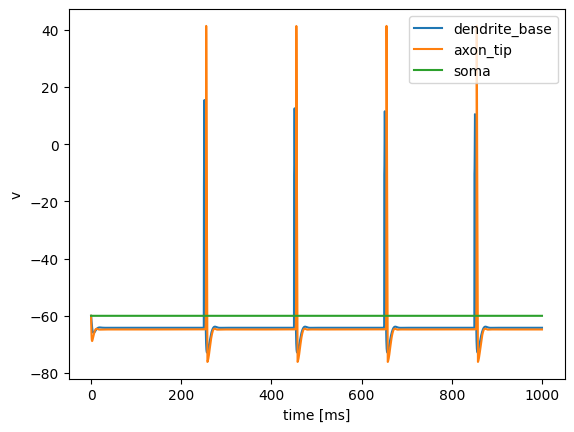

In [43]:
# Plot the results
axes = cmp.plot_results()

(240.0, 280.0)

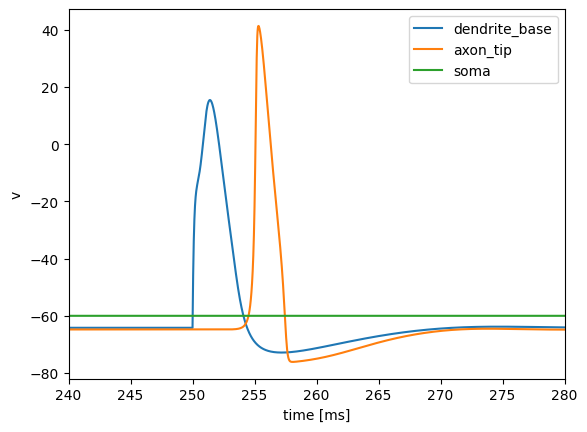

In [44]:
# Plot again and zoom in on one spike
axes = cmp.plot_results()
axes[0].set_xlim(240, 280)

In [45]:
# First we need to reset our model (by re-assigning `cmp` the old model will be garbage-collected)
cmp = nrn.CompartmentModel(n, res=10)

# Set properties and mechanisms
cmp.Ra, cmp.cm = 266.1, 0.8
cmp.insert("pas", g=1 / 20800, e=-60)
axon_secs = list(set(cmp.get_node_section(axon_nodes)))
cmp.insert("hh", subset=axon_secs)

# Add recording
cmp.add_voltage_record(dend_base, label="dendrite_base")
cmp.add_voltage_record(axo_tip, label="axon_tip")
cmp.add_voltage_record(n.soma, label="soma")

# Also add a spike counter at the axon
cmp.add_spike_detector(axo_tip, label="axon_tip")

# Now add a noisy preinput to say 20 dendritic postsynapses
post = n.connectors[
    (n.connectors.compartment == "dendrite") & (n.connectors.type == "post")
]
cmp.add_synaptic_input(
    post.node_id.unique()[0:20],
    spike_no=20,  # produce 20 presynaptic spikes
    spike_int=50,  # with an average interval of 50ms: 20 * 50ms = over 1s
    spike_noise=1,  # very noisy!
    cn_weight=0.04,
)
# Run for 1s
cmp.run_simulation(1000, v_init=-60)

Text(0, 0.5, 'spikes [Hz]')

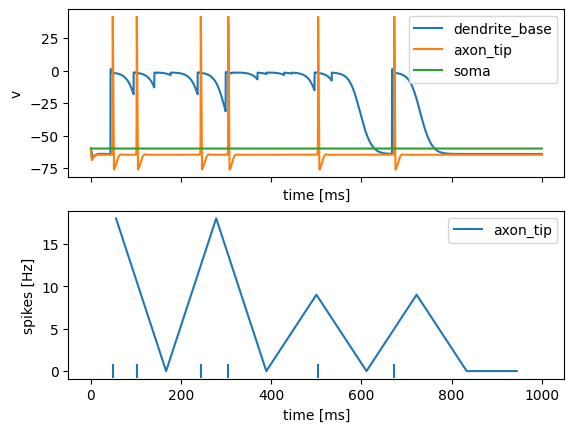

In [46]:
# Plot results
axes = cmp.plot_results()
axes[1].set_ylabel("spikes [Hz]")

In [57]:
# First we need to reset our model (by re-assigning `cmp` the old model will be garbage-collected)
cmp = nrn.CompartmentModel(n, res=10)

# Set properties and mechanisms
cmp.Ra, cmp.cm = 266.1, 0.8
cmp.insert("pas", g=1 / 20800, e=-60)
axon_secs = list(set(cmp.get_node_section(axon_nodes)))
cmp.insert("hh", subset=axon_secs)

# Add recording
cmp.add_voltage_record(n.nodes.node_id.values)

# Get dendritic postsynapses
post = n.postsynapses[n.postsynapses.compartment == "dendrite"]

# Add synaptic input to the first 10 postsynapses after 2 ms
cmp.add_synaptic_current(where=post.node_id.unique()[0:10], start=2, max_syn_cond=0.1, rev_pot=-10)

# This is equivalent to neuron.h.finitialize + neuron.h.continuerun
cmp.run_simulation(100, v_init=-60)

In [58]:
import numpy as np
import pandas as pd

# Collect the voltage recordings at each node
records = pd.DataFrame(np.vstack([r.as_numpy() for r in cmp.records['v'].values()]), index=list(cmp.records['v'].keys()))

# Reindex to make sure it matches the node table
records = records.reindex(n.nodes.node_id)

records.head()

,0,1,2,3,4,5,6,7,8,9,...,3991,3992,3993,3994,3995,3996,3997,3998,3999,4000
node_id,,,,,,,,,,,,,,,,,,,,,
0,-60.0,-60.265901,-60.522424,-60.770669,-61.011606,-61.246079,-61.474742,-61.698152,-61.916781,-62.131019,...,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368
3,-60.0,-60.265901,-60.522424,-60.770669,-61.011606,-61.246079,-61.474742,-61.698152,-61.916781,-62.131019,...,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368
1,-60.0,-60.265901,-60.522424,-60.770669,-61.011606,-61.246079,-61.474742,-61.698152,-61.916781,-62.131019,...,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368
4,-60.0,-60.265901,-60.522424,-60.770669,-61.011606,-61.246079,-61.474742,-61.698152,-61.916781,-62.131019,...,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368
6,-60.0,-60.265901,-60.522424,-60.770669,-61.011606,-61.246079,-61.474742,-61.698152,-61.916781,-62.131019,...,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368,-64.778368


In [1]:
# plot the data
import matplotlib.pyplot as plt

for idx, row in records.iterrows():
    plt.plot(row.values + idx * 6, color="k", lw=0.5)  # offset each trace for visibility
plt.xlabel("Time (ms)")
plt.ylabel("Node ID (offset for visibility)")
plt.title("Voltage traces at each node")
plt.show()

NameError: name 'records' is not defined

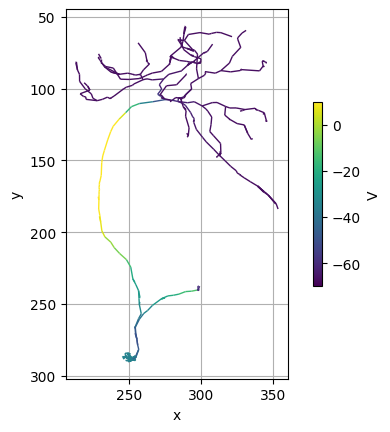

In [60]:
n.nodes['v'] = records.loc[:, int(5 / 0.025)].values

# Plot
fig, ax = navis.plot2d(
    n,
    method="2d",
    color_by="v",  # color by the voltage column
    palette="viridis",
    vmin = -70,
    vmax = 10,
    view=('x', '-y')
)

# Manually add a colorbar
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
sm = ScalarMappable(norm=plt.Normalize(vmin=-70, vmax=10), cmap='viridis')
_ = fig.colorbar(sm, ax=ax, fraction=0.075, shrink=0.5, label="V")

2025-10-07 18:18:05 - INFO - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


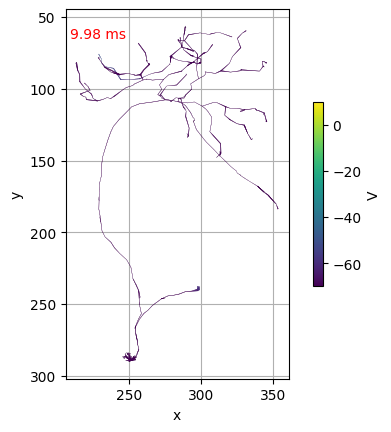

In [61]:
# Convert our skeleton to a mesh for nicer visualization
mesh = navis.conversion.tree2meshneuron(n, warn_missing_radii=False)

# Plot the neuron
fig, ax = navis.plot2d(mesh, method='2d',color='k', view=('x','-y'))

sm = ScalarMappable(norm=plt.Normalize(vmin=-70, vmax=10), cmap='viridis')
_ = fig.colorbar(sm, ax=ax, fraction=0.075, shrink=0.5, label="V")

# Add a text in the top right for the timestamp
t = ax.text(0.02, 0.95, 'ms', ha='left', va='top', transform=ax.transAxes, color='r')

# Get the collection representing our neuron
c = ax.collections[0]
c.set_cmap('viridis')
c.set_norm(plt.Normalize(vmin=-70, vmax=10))

# This function updates the voltages according to the frame
def animate(i):
    # We need to map the voltages at individual nodes to faces in the mesh
    # First nodes to vertices
    vert_voltage = records[i].values[mesh.vertex_map]
    # Then vertices to faces
    face_voltage = vert_voltage[mesh.faces].mean(axis=1)
    # Set the values
    c.set_array(face_voltage)
    # Also update the timestamp
    t.set_text(f'{i * 0.025:.2f} ms')
    return (c, t)

import matplotlib.animation as animation
ani = animation.FuncAnimation(fig, animate, interval=40, blit=True, repeat=True, frames=400)
from IPython.display import HTML
HTML(ani.to_jshtml())